In [1]:
%matplotlib inline
%load_ext autoreload

import warnings
warnings.filterwarnings("ignore") # disable warnings

from os import getcwd
from os.path import join, abspath, pardir, exists
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.figure_factory as ff
import plotly.offline as pyo
pyo.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

from scipy.stats import ttest_ind, chi2_contingency
from scipy.stats.stats import pearsonr
from IPython.core.interactiveshell import InteractiveShell

#### Config settings

In [2]:
parent_dir = abspath(join(join(getcwd(), pardir), pardir))
data_dir = join(parent_dir, "data")
data_file = join(data_dir, "speed_dating.csv")

# For IPython

InteractiveShell.ast_node_interactivity = "all" # To show all output after each cell execution (instead of the last output)

# For pandas

pd.options.display.max_columns = 200 # display upto 200 columns (instead of default 20)
pd.options.display.max_rows = 200 # display upto 200 rows (instead of default 60)
pd.options.mode.use_inf_as_na = True # Consider '' and np.inf as np.NaN values (https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.isna.html)


In [3]:
# df = pd.read_csv(data_file, encoding= 'unicode_escape')
df = pd.read_csv(data_file, encoding= 'ISO-8859-1')
df.head()

,iid,id,gender,idg,condtn,wave,round,position,positin1,order,partner,pid,match,int_corr,samerace,age_o,race_o,pf_o_att,pf_o_sin,pf_o_int,pf_o_fun,pf_o_amb,pf_o_sha,dec_o,attr_o,sinc_o,intel_o,fun_o,amb_o,shar_o,like_o,prob_o,met_o,age,field,field_cd,undergra,mn_sat,tuition,race,imprace,imprelig,from,zipcode,income,goal,date,go_out,career,career_c,sports,tvsports,exercise,dining,museums,art,hiking,gaming,clubbing,reading,tv,theater,movies,concerts,music,shopping,yoga,exphappy,expnum,attr1_1,sinc1_1,intel1_1,fun1_1,amb1_1,shar1_1,attr4_1,sinc4_1,intel4_1,fun4_1,amb4_1,shar4_1,attr2_1,sinc2_1,intel2_1,fun2_1,amb2_1,shar2_1,attr3_1,sinc3_1,fun3_1,intel3_1,amb3_1,attr5_1,sinc5_1,intel5_1,fun5_1,amb5_1,dec,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,attr1_s,sinc1_s,intel1_s,fun1_s,amb1_s,shar1_s,attr3_s,sinc3_s,intel3_s,fun3_s,amb3_s,satis_2,length,numdat_2,attr7_2,sinc7_2,intel7_2,fun7_2,amb7_2,shar7_2,attr1_2,sinc1_2,intel1_2,fun1_2,amb1_2,shar1_2,attr4_2,sinc4_2,intel4_2,fun4_2,amb4_2,shar4_2,attr2_2,sinc2_2,intel2_2,fun2_2,amb2_2,shar2_2,attr3_2,sinc3_2,intel3_2,fun3_2,amb3_2,attr5_2,sinc5_2,intel5_2,fun5_2,amb5_2,you_call,them_cal,date_3,numdat_3,num_in_3,attr1_3,sinc1_3,intel1_3,fun1_3,amb1_3,shar1_3,attr7_3,sinc7_3,intel7_3,fun7_3,amb7_3,shar7_3,attr4_3,sinc4_3,intel4_3,fun4_3,amb4_3,shar4_3,attr2_3,sinc2_3,intel2_3,fun2_3,amb2_3,shar2_3,attr3_3,sinc3_3,intel3_3,fun3_3,amb3_3,attr5_3,sinc5_3,intel5_3,fun5_3,amb5_3
0,1,1.0,0,1,1,1,10,7,NaN,4,1,11.0,0,0.14,0,27.0,2.0,35.0,20.0,20.0,20.0,0.0,5.0,0,6.0,8.0,8.0,8.0,8.0,6.0,7.0,4.0,2.0,21.0,Law,1.0,NaN,NaN,NaN,4.0,2.0,4.0,Chicago,"60,521","69,487.00",2.0,7.0,1.0,lawyer,NaN,9.0,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,10.0,10.0,9.0,8.0,1.0,3.0,2.0,15.0,20.0,20.0,15.0,15.0,15.0,NaN,NaN,NaN,NaN,NaN,NaN,35.0,20.0,15.0,20.0,5.0,5.0,6.0,8.0,8.0,8.0,7.0,NaN,NaN,NaN,NaN,NaN,1,6.0,9.0,7.0,7.0,6.0,5.0,7.0,6.0,2.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,2.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,19.44,16.67,13.89,22.22,11.11,16.67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,7.0,8.0,7.0,6.0,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0,NaN,NaN,15.0,20.0,20.0,15.0,15.0,15.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
1,1,1.0,0,1,1,1,10,7,NaN,3,2,12.0,0,0.54,0,22.0,2.0,60.0,0.0,0.0,40.0,0.0,0.0,0,7.0,8.0,10.0,7.0,7.0,5.0,8.0,4.0,2.0,21.0,Law,1.0,NaN,NaN,NaN,4.0,2.0,4.0,Chicago,"60,521","69,487.00",2.0,7.0,1.0,lawyer,NaN,9.0,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,10.0,10.0,9.0,8.0,1.0,3.0,2.0,15.0,20.0,20.0,15.0,15.0,15.0,NaN,NaN,NaN,NaN,NaN,NaN,35.0,20.0,15.0,20.0,5.0,5.0,6.0,8.0,8.0,8.0,7.0,NaN,NaN,NaN,NaN,NaN,1,7.0,8.0,7.0,8.0,5.0,6.0,7.0,5.0,1.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,2.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,19.44,16.67,13.89,22.22,11.11,16.67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,7.0,8.0,7.0,6.0,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0,NaN,NaN,15.0,20.0,20.0,15.0,15.0,15.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
2,1,1.0,0,1,1,1,10,7,NaN,10,3,13.0,1,0.16,1,22.0,4.0,19.0,18.0,19.0,18.0,14.0,12.0,1,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,1.0,21.0,Law,1.0,NaN,NaN,NaN,4.0,2.0,4.0,Chicago,"60,521","69,487.00",2.0,7.0,1.0,lawyer,NaN,9.0,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,10.0,10.0,9.0,8.0,1.0,3.0,2.0,15.0,20.0,20.0,15.0,15.0,15.0,NaN,NaN,NaN,NaN,NaN,NaN,35.0,20.0,15.0,20.0,5.0,5.0,6.0,8.0,8.0,8.0,7.0,NaN,NaN,NaN,NaN,NaN,1,5.0,8.0,9.0,8.0,5.0,7.0,7.0,NaN,1.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,2.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,19.44,16.67,13.89,22.22,11.11,16.67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,7.0,8.0,7.0,6.0,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0,NaN,NaN,15.0,20.0,20.0,15.0,15.0,15.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
3,1,1.0,0,1,1,1,10,7,NaN,5,4,14.0,1,0.61,0,23.0,2.0,30.0,5.0,15.0,40.0,5.0,5.0,1,7.0,8.0,9.0,8.0,9

#### Basic checks

In [4]:
len(df)
len(df.columns)
# df.dtypes

8378

195

#### Helper functions

In [17]:
col_mapping = {"attr": "Attractive", "sinc": "Sincere", "intel": "Intelligent", "fun": "Fun", "amb": "Ambitious", "shar": "Shared Interest",
    "attr1_1": "Attractive", "sinc1_1": "Sincere", "intel1_1": "Intelligent", "fun1_1": "Fun", "amb1_1": "Ambitious", "shar1_1": "Shared Interest",
    "attr2_1": "Attractive", "sinc2_1": "Sincere", "intel2_1": "Intelligent", "fun2_1": "Fun", "amb2_1": "Ambitious", "shar2_1": "Shared Interest",
    "attr4_1": "Attractive", "sinc4_1": "Sincere", "intel4_1": "Intelligent", "fun4_1": "Fun", "amb4_1": "Ambitious", "shar4_1": "Shared Interest"}
    
def rename_cols(cols: list) -> list:
    _cols = list()
    for col in cols:
        if col in col_mapping.keys():
            _cols.append(col_mapping[col])
        else:
            _cols.append(col)
    return _cols

def col_normalize(x, col1, col2):
    x[col1] = (x[col1] / x[col2]) * 100
    return x 

### Profile Report

In [6]:
profile = ProfileReport(df, title="Speed Dating Report", minimal=True, vars={"num": {"low_categorical_threshold": 0}})
profile.to_notebook_iframe() # Show as inline plot
profile.to_file(join(data_dir, "pandas_profile.html")) # Save it to a file

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

#### Findings
- Profiling is a good EDA tool. We can see the important details right away without much manual effort.
- We have `195` columns; `187` numeric and `8` categorical columns.
- `8` columns have high cardinality. `147` have missing values and `59` have zeros.
- Most of the features needs transformations to standardize and normalize.
- Some features have negatively-skewed distributions. (need to apply appropiate transformations. Some common transformations can be found [here](https://medium.com/@TheDataGyan/day-8-data-transformation-skewness-normalization-and-much-more-4c144d370e55))
- Some features have missing values. (need to imputate data)

## Gender based analysis

### 1. Let's see what's the ratio b/w men and women participants

<AxesSubplot:xlabel='gender', ylabel='count'>

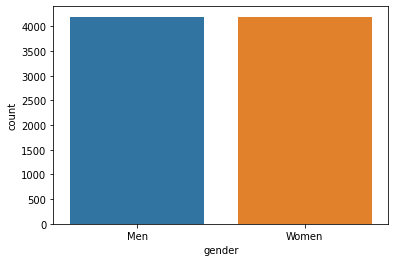

In [7]:
gender_df = df.gender.replace(0, "Men").replace(1, "Women").to_frame(name='gender')
sns.countplot(x='gender', data=gender_df)

#### Findings

- Same ratio between men and women 

### 2. Which attributes does each gender look for ? 

Columns with NaN values: ['pid', 'attr', 'sinc', 'intel', 'fun', 'amb', 'shar', 'like', 'prob']


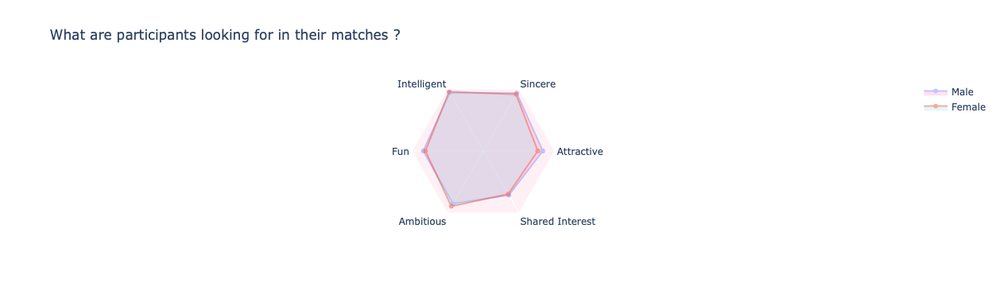

In [8]:
cols = ["iid", "pid", "dec", "gender", "attr", "sinc", "intel", "fun", "amb", "shar", "like", "prob"]
_df = df[cols]
print("Columns with NaN values: {}".format(_df.columns[_df.isna().any()].tolist()))

# _df[_df.pid.isna()].head(3)
# Remove records those which has no pid 
_df.dropna(how='any', axis=0, subset=['pid'], inplace=True)

# Drop rows where all attributes are NaN (col 4-9)
# Since in the instructions it clearly outlined that not attributes will be discussed during the couple's meetings, we cannot do a full NaN drop in the data. 
# The workaround here is to drop all rows where all the attributes are NaN
# Removing only for columns 'attr', 'sinc', 'intel', 'fun', 'amb', 'shar' & 'like'

attr_cols = cols[4:-2]
_df.dropna(how='all', axis=0, subset=attr_cols, inplace=True)

_cols = [*attr_cols, attr_cols[0]]
_cols = rename_cols(_cols)

_women_attrs = _df[_df.gender == 0][attr_cols].mean(axis=0).to_list()
_men_attrs = _df[_df.gender == 1][attr_cols].mean(axis=0).to_list()

_women_attrs = [*_women_attrs, _women_attrs[0]]
_men_attrs = [*_men_attrs, _men_attrs[0]]

fig = go.Figure(
    data=[
        go.Scatterpolar(r=_men_attrs, theta=_cols, fill='toself', name='Male', fillcolor='rgba(255, 110, 180, 0.5)', opacity=0.4),
        go.Scatterpolar(r=_women_attrs, theta=_cols, fill='toself', name='Female', fillcolor='rgba(142, 229, 238, 0.5)', opacity=0.5),
    ],
    layout=go.Layout(
        title=go.layout.Title(text='What are participants looking for in their matches ?'),
        polar={'radialaxis': {'visible': False} , "bgcolor": "lavenderblush", "gridshape": "linear" },
        showlegend=True
    )
)

fig.show()

#### Findings

- Both genders are generally evenly distributed across all of the attributes.
- Altough, male participants give slightly more weightage to the attractiveness of the female.
- And female participants give slightly more importance to the ambitious men as compared to others.

#### Personal conclusion

- Men are looking for attractive women. 
- Women are looking for a well-rounded male.

### 3. What are participants looking for in their matches ?

In [9]:
attr_cols = cols[2:]
_df.dropna(how='all', axis=0, subset=attr_cols, inplace=True)
_df['attr_sum'] = _df[attr_cols].sum(axis=1)
_df.head()

,iid,pid,dec,gender,attr,sinc,intel,fun,amb,shar,like,prob,attr_sum
0,1,11.0,1,0,6.0,9.0,7.0,7.0,6.0,5.0,7.0,6.0,54.0
1,1,12.0,1,0,7.0,8.0,7.0,8.0,5.0,6.0,7.0,5.0,54.0
2,1,13.0,1,0,5.0,8.0,9.0,8.0,5.0,7.0,7.0,NaN,50.0
3,1,14.0,1,0,7.0,6.0,8.0,7.0,6.0,8.0,7.0,6.0,56.0
4,1,15.0,1,0,5.0,6.0,7.0,7.0,6.0,6.0,6.0,6.0,50.0


Columns with NaN values: ['attr1_1', 'sinc1_1', 'intel1_1', 'fun1_1', 'amb1_1', 'shar1_1']


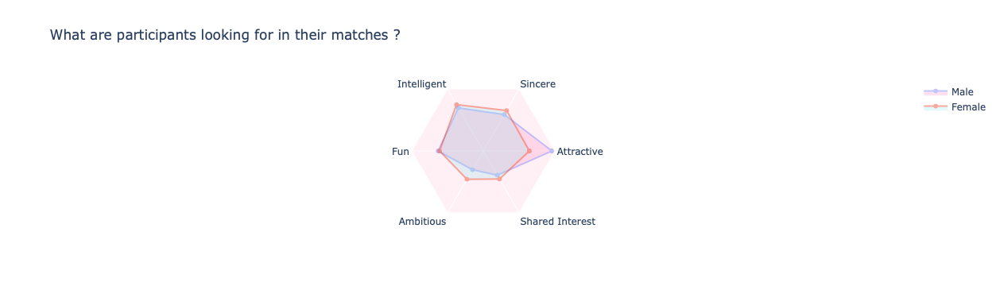

In [11]:
cols = ["iid", "gender", "attr1_1", "sinc1_1", "intel1_1", "fun1_1", "amb1_1", "shar1_1"]
_df = df[cols]
print("Columns with NaN values: {}".format(_df.columns[_df.isna().any()].tolist()))
# _df.groupby('gender').describe()
# _df.groupby('gender').nunique()

# Sum of columns: 'attr1_1', 'sinc1_1', 'intel1_1', 'fun1_1', 'amb1_1' & 'shar1_1' should be 100. But as seen from the data, there are wrong and missing entries.
# As a work around, let's scale them by 0-100

attr_cols = cols[2:]
_df.dropna(how='all', axis=0, subset=attr_cols, inplace=True) # Drop all those rows which has 0 sum (missing data)

# For incorrect data

_df['attr_sum'] = _df[attr_cols].sum(axis=1) # Calculate the sum

# If you have sum greater than 100, it means your data was incorrect. Normalize it to 0 - 100 range

def col_normalize(x, col1, col2):
    x[col1] = (x[col1] / x[col2]) * 100
    return x 

for attr in attr_cols:
    _df = _df.apply(lambda x: x if x['attr_sum'] <= float(100) else col_normalize(x, attr, 'attr_sum'), axis=1)

_df.drop(['attr_sum'], axis=1, inplace=True) # remove sum column

_cols = [*attr_cols, attr_cols[0]]
_cols = rename_cols(_cols)

_women_attrs = _df[_df.gender == 0][attr_cols].mean(axis=0).to_list()
_men_attrs = _df[_df.gender == 1][attr_cols].mean(axis=0).to_list()

_women_attrs = [*_women_attrs, _women_attrs[0]]
_men_attrs = [*_men_attrs, _men_attrs[0]]


fig = go.Figure(
    data=[
        go.Scatterpolar(r=_men_attrs, theta=_cols, fill='toself', name='Male', fillcolor='rgba(255, 110, 180, 0.5)', opacity=0.4),
        go.Scatterpolar(r=_women_attrs, theta=_cols, fill='toself', name='Female', fillcolor='rgba(142, 229, 238, 0.5)', opacity=0.5),
    ],
    layout=go.Layout(
        title=go.layout.Title(text='What are participants looking for in their matches ?'),
        polar={'radialaxis': {'visible': False} , "bgcolor": "lavenderblush", "gridshape": "linear" },
        showlegend=True
    )
)

fig.show()


#### Findings

- For male participants, the attractiveness of the female is given a lot more weight, and the ambitiousness or if they have any shared interset are ranked not as high
- For females, the points are more evenly distributed across all of the attributes, with ambitious and intelligence ranked slightly higher compared to others.

#### Personal conclusion

- Men are looking for attractive women, and are less concerned with a woman’s abmition and shared interests. 
- On the other hand, women are looking for a well-rounded male and value intelligence in a man.

### 4. What paricipants think their same-sex peers are looking for ?

In [15]:
cols = ["iid", "gender", "attr4_1", "sinc4_1", "intel4_1", "fun4_1", "amb4_1", "shar4_1"]
_df = df[cols]
print("Columns with NaN values: {}".format(_df.columns[_df.isna().any()].tolist()))

# Sum of columns: 'attr4_1', 'sinc4_1', 'intel4_1', 'fun4_1', 'amb4_1' & 'shar4_1' should be 100. But as seen from the data, there are wrong and missing entries.
# As a work around, let's scale them by 0-100

attr_cols = cols[2:]
_df.dropna(how='all', axis=0, subset=attr_cols, inplace=True) # Drop all those rows which has 0 sum (missing data)

# For incorrect data

_df['attr_sum'] = _df[attr_cols].sum(axis=1) # Calculate the sum

# If you have sum greater than 100, it means your data was incorrect. Normalize it to 0 - 100 range

# def col_normalize(x, col1, col2):
#     x[col1] = (x[col1] / x[col2]) * 100
#     return x 

for attr in attr_cols:
    _df = _df.apply(lambda x: x if x['attr_sum'] <= float(100) else col_normalize(x, attr, 'attr_sum'), axis=1)

_df.drop(['attr_sum'], axis=1, inplace=True) # remove sum column

_cols = [*attr_cols, attr_cols[0]]
_cols = rename_cols(_cols)

_women_attrs = _df[_df.gender == 0][attr_cols].mean(axis=0).to_list()
_men_attrs = _df[_df.gender == 1][attr_cols].mean(axis=0).to_list()

_women_attrs = [*_women_attrs, _women_attrs[0]]
_men_attrs = [*_men_attrs, _men_attrs[0]]

fig = go.Figure(
    data=[
        go.Scatterpolar(r=_men_attrs, theta=_cols, fill='toself', name='Male', fillcolor='rgba(255, 110, 180, 0.5)', opacity=0.4),
        go.Scatterpolar(r=_women_attrs, theta=_cols, fill='toself', name='Female', fillcolor='rgba(142, 229, 238, 0.5)', opacity=0.5),
    ],
    layout=go.Layout(
        title=go.layout.Title(text='What paricipants think their same-sex peers are looking for ?'),
        polar={'radialaxis': {'visible': False} , "bgcolor": "lavenderblush", "gridshape": "linear" },
        showlegend=True
    )
)

fig.show()



Columns with NaN values: ['attr4_1', 'sinc4_1', 'intel4_1', 'fun4_1', 'amb4_1', 'shar4_1']


#### Findings

- Similar to the previous analysis, men think their fellow mates highly value attractiveness and are less concerned with a woman’s ambition.
- In contrast, there exist a significant difference in women’s answers in comparison to the presvious analysis. Women say that they themselves are looking for a well rounded man and attractiveness is not necessarily important. However, they think that other women are mainly looking for attractive and ambitious men.

#### Personal conclusion

- Both men and women think that their competitors are looking for attractive counterparts, and what women say they are looking for is drastically different from what other women think their peers value.



### 5. What do participants think the opposite sex is looking for ?

In [18]:
cols = ["iid", "gender", "attr2_1", "sinc2_1", "intel2_1", "fun2_1", "amb2_1", "shar2_1"]
_df = df[cols]
print("Columns with NaN values: {}".format(_df.columns[_df.isna().any()].tolist()))

# Sum of columns: 'attr2_1', 'sinc2_1', 'intel2_1', 'fun2_1', 'amb2_1' & 'shar2_1' should be 100. But as seen from the data, there are wrong and missing entries.
# As a work around, let's scale them by 0-100

attr_cols = cols[2:]
_df.dropna(how='all', axis=0, subset=attr_cols, inplace=True) # Drop all those rows which has 0 sum (missing data)

# For incorrect data

_df['attr_sum'] = _df[attr_cols].sum(axis=1) # Calculate the sum

# If you have sum greater than 100, it means your data was incorrect. Normalize it to 0 - 100 range

# def col_normalize(x, col1, col2):
#     x[col1] = (x[col1] / x[col2]) * 100
#     return x 

for attr in attr_cols:
    _df = _df.apply(lambda x: x if x['attr_sum'] <= float(100) else col_normalize(x, attr, 'attr_sum'), axis=1)

_df.drop(['attr_sum'], axis=1, inplace=True) # remove sum column

_cols = [*attr_cols, attr_cols[0]]
_cols = rename_cols(_cols)

_women_attrs = _df[_df.gender == 0][attr_cols].mean(axis=0).to_list()
_men_attrs = _df[_df.gender == 1][attr_cols].mean(axis=0).to_list()

_women_attrs = [*_women_attrs, _women_attrs[0]]
_men_attrs = [*_men_attrs, _men_attrs[0]]

fig = go.Figure(
    data=[
        go.Scatterpolar(r=_men_attrs, theta=_cols, fill='toself', name='Male', fillcolor='rgba(255, 110, 180, 0.5)', opacity=0.4),
        go.Scatterpolar(r=_women_attrs, theta=_cols, fill='toself', name='Female', fillcolor='rgba(142, 229, 238, 0.5)', opacity=0.5),
    ],
    layout=go.Layout(
        title=go.layout.Title(text='What do participants think the opposite sex is looking for ?'),
        polar={'radialaxis': {'visible': False} , "bgcolor": "lavenderblush", "gridshape": "linear" },
        showlegend=True
    )
)

fig.show()



Columns with NaN values: ['attr2_1', 'sinc2_1', 'intel2_1', 'fun2_1', 'amb2_1', 'shar2_1']


#### Findings

- Women strongly feel that men are most concerned with a woman’s attractiveness and that other attributes are not as important, especially ambitiousness.
- Comapring female and male answers in the first graph, we can see that there are not that much difference between the two. We can say that women almost accurately predicted what men are looking for in their partners (i.e. attractiveness).
- Additionally, men’s predictions were not far off either. By comparing males’ responses here and female’s responses in the first graph, what men think women are looking for also closely resembles what women say they are looking for. The main differences, though, are a higher attractiveness score and a lower shared interest score.

#### Personal conclusion

- Both men and women can predict what the opposite sex are looking for in their partners to a certain degree.

> Note: We must note that all of the answers here are based on a survey conducted before the actual speed dating event. The responses provided are based on what people “say” they want, and we will compare this with the next analysis to see if people’s decisions are consistent with their answers.

### Which of the 6 attributes actually influence decision making ?

During all events, each person will be able to meet with an average of 12 people of the other sex and have 4 minutes to talk with them. After that, they will rate their partners on the previous 6 attributions and indicate if they are interested in meeting with that person again.

Here, we aim to discover which attributes are most important in getting a positive response from their partners.

On the x-axis, we calculate how many positive responses can a person get from the opposite sex. For example, if a man met with 10 women and 6 of them indicated that they would like to meet him again, his positive response rate would be 60%. On the y-axis, we averaged the scores in the 6 attributes that the man received from the 10 women.

Finally, the Pearson Product-Moment Correlation Coefficient (R score) is calculated for each of the attributes to show how strong the correlation is between the positive response rate and the score of the attributes.

---

#### Influence of Attributes to Match Making

In [23]:
cols = ["pid", "gender", "dec", "attr", "sinc", "intel", "fun", "amb", "shar"]
_df = df[cols]
print("Columns with NaN values: {}".format(_df.columns[_df.isna().any()].tolist()))

_df.dropna(how='any', axis=0, subset=cols, inplace=True) # Remove all NaN values

Columns with NaN values: ['pid', 'attr', 'sinc', 'intel', 'fun', 'amb', 'shar']


In [31]:
_df.groupby(['pid', 'gender']).describe().head(3)

dec                                               attr            \
           count      mean       std  min  25%  50%  75%  max count      mean   
pid gender                                                                      
1.0 1       10.0  0.500000  0.527046  0.0  0.0  0.5  1.0  1.0  10.0  6.700000   
2.0 1       10.0  0.600000  0.516398  0.0  0.0  1.0  1.0  1.0  10.0  7.700000   
3.0 1        9.0  0.444444  0.527046  0.0  0.0  0.0  1.0  1.0   9.0  6.555556   

                                                 sinc                      \
                 std  min  25%  50%   75%   max count      mean       std   
pid gender                                                                  
1.0 1       1.766981  3.0  6.0  7.0  7.00  10.0  10.0  7.400000  1.173788   
2.0 1       1.636392  5.0  7.0  7.5  8.75  10.0  10.0  7.100000  2.233582   
3.0 1       1.666667  4.0  6.0  7.0  7.00  10.0   9.0  6.777778  2.108185   

                                      intel                                 \
            min  25%  50%   75%   max count      mean       std  min   25%   
pid gender                                                                   
1.0 1       6.0  7.0  7.0  8.00  10.0  10.0  8.000000  1.632993  5.0  7.25   
2.0 1       3.0  6.0  7.0  8.75  10.0  10.0  7.900000  2.024846  4.0  7.00   
3.0 1       3.0  6.0  7.0  8.00  10.0   9.0  7.222222  1.855921  5.0  6.00   

                              fun                                           \
            50%   75%   max count      mean       std  min   25%  50%  75%   
pid gender                                                                   
1.0 1       8.0  9.00  10.0  10.0  7.200000  1.475730  5.0  6.00  7.5  8.0   
2.0 1       8.0  9.75  10.0  10.0  7.500000  2.321398  3.0  6.25  8.0  9.0   
3.0 1       6.0  8.00  10.0   9.0  6.222222  2.048034  4.0  5.00  6.0  8.0   

                   amb                                                  shar  \
             max count      mean       std  min   25%  50%   75%   max count   
pid gender                                                                     
1.0 1       10.0  10.0  8.000000  1.154701  6.0  7.25  8.0  8.75  10.0  10.0   
2.0 1       10.0  10.0  7.500000  1.509231  5.0  7.00  7.0  8.75  10.0  10.0   
3.0 1       10.0   9.0  7.111111  1.536591  5.0  6.00  7.0  8.00  10.0   9.0   

                                                      
           mean       std  min  25%  50%   75%   max  
pid gender                                            
1.0 1       7.1  1.523884  5.0  6.0  7.0  7.75  10.0  
2.0 1       6.5  2.223611  3.0  5.0  7.0  7.75  10.0  
3.0 1       6.0  2.061553  4.0  4.0  6.0  7.00  10.0

In [35]:
_df = _df.groupby(['pid', 'gender']).mean()

<AxesSubplot:xlabel='dec', ylabel='attr'>

<AxesSubplot:xlabel='dec', ylabel='sinc'>

<AxesSubplot:xlabel='dec', ylabel='intel'>

<AxesSubplot:xlabel='dec', ylabel='fun'>

<AxesSubplot:xlabel='dec', ylabel='amb'>

<AxesSubplot:xlabel='dec', ylabel='shar'>

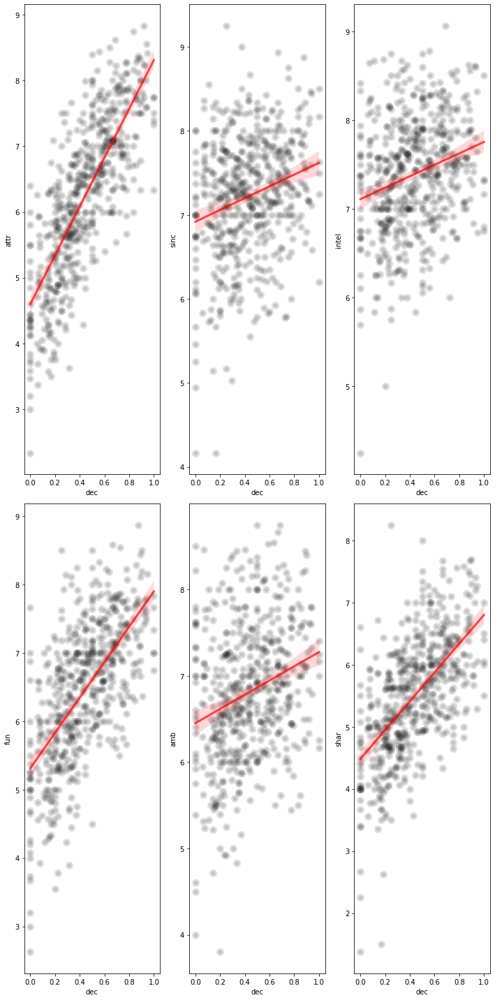

In [47]:
#sns.regplot(x="dec", y="attr", data=_df, line_kws={"color": "r", "alpha": 0.7, "lw": 3}, scatter_kws={"color": "black", "alpha": 0.12, "lw": 5})
#plt.show()


fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(20, 10))

sns.regplot(data=_df, x='dec', y='attr', line_kws={"color": "r", "alpha": 0.7, "lw": 3}, scatter_kws={"color": "black", "alpha": 0.12, "lw": 5}, ax=ax[0,0])
sns.regplot(data=_df, x='dec', y='sinc', line_kws={"color": "r", "alpha": 0.7, "lw": 3}, scatter_kws={"color": "black", "alpha": 0.12, "lw": 5}, ax=ax[0,1])
sns.regplot(data=_df, x='dec', y='intel', line_kws={"color": "r", "alpha": 0.7, "lw": 3}, scatter_kws={"color": "black", "alpha": 0.12, "lw": 5}, ax=ax[0,2])
sns.regplot(data=_df, x='dec', y='fun', line_kws={"color": "r", "alpha": 0.7, "lw": 3}, scatter_kws={"color": "black", "alpha": 0.12, "lw": 5}, ax=ax[1,0])
sns.regplot(data=_df, x='dec', y='amb', line_kws={"color": "r", "alpha": 0.7, "lw": 3}, scatter_kws={"color": "black", "alpha": 0.12, "lw": 5}, ax=ax[1,1])
sns.regplot(data=_df, x='dec', y='shar', line_kws={"color": "r", "alpha": 0.7, "lw": 3}, scatter_kws={"color": "black", "alpha": 0.12, "lw": 5}, ax=ax[1,2])

fig.set_tight_layout('tight')
